# Multilayer Perceptron Experiments on Sine Wave Part 2

## Functions and Imports

In [134]:
import torch
torch.manual_seed(0)


import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

device=torch.device('cuda')

# for visualization of animation
from PIL import Image
from matplotlib import animation
from IPython.display import HTML

In [135]:
def gen_data(L=1000, start=-30*torch.pi, end=30*torch.pi, reverse=False):

    x = torch.linspace(start, end, L)
    y = torch.sin(x)

    x_train = x[3*L//8: 5*L//8]
    y_train = y[3*L//8: 5*L//8]

    x_test = torch.concatenate([x[:3*L//8], x[5*L//8:]])
    y_test = torch.concatenate([y[:3*L//8], y[5*L//8:]])


    if reverse: # reverse train and test
        return x_test, y_test, x_train, y_train
    else:
        return x_train, y_train, x_test, y_test

In [231]:
class MLP(nn.Module):
    def __init__(self, count_nodes, resnet=False):
        super().__init__()

        self.count_nodes = count_nodes
        self.resnet = resnet

        self.linear = nn.Linear(count_nodes, count_nodes)

        self.input_layer = nn.Sequential(*[
            nn.Linear(1, count_nodes),
            nn.LayerNorm(count_nodes),
            nn.ReLU(inplace=True),
            # nn.Tanh(),
        ])

        self.hidden_layer = nn.Sequential(*[
            nn.Linear(count_nodes, count_nodes),
            nn.LayerNorm(count_nodes),
            nn.ReLU(inplace=True),
            # nn.Tanh()
        ])
            
        # output
    
        self.feat_layer = nn.Sequential(*[nn.Linear(count_nodes, 42), nn.Tanh()]) # we dont want features to blow up
        self.output_layer = nn.Sequential(*[nn.Linear(42, 1), nn.Tanh()]) # because we want to constrain

        # apply weights        
        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_normal_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x0):
        x0 = x0.to(device)
        
        if self.resnet:
            # for resnet
            x = x0.expand(-1, self.count_nodes)
            x = self.linear(self.input_layer(x0)) + x
            x = self.linear(self.hidden_layer(x)) + x
            x = self.linear(self.hidden_layer(x)) + x
            x = self.feat_layer(x)

        else:
            x = self.input_layer(x0)
            x = self.hidden_layer(x)
            x = self.hidden_layer(x)
            x = self.feat_layer(x)
        
        # x = x / torch.sum(x) # normalize feats. makes it less expressive
        self.x_feats = x # / torch.sum(x) # normalize feats. makes it less expressive

        x_out = self.output_layer(x)

        return x_out

In [232]:
# model = MLP(count_hidden=2, count_nodes=256, 
#             use_batchnorm=False, use_xavier_normal=True)
# model = model.to(device)
# model(x_train[:3, None])

In [235]:
def train_model(model, epochs=1000):
    torch.manual_seed(0)
    model.train()
    
    for k in range(epochs):

        # shuffle x_train
        inds = np.random.choice(range(len(x_train)), size=len(x_train), replace=False)

        x_inp = x_train[inds]
        y_inp = y_train[inds]

        batch_idx = np.random.choice(np.arange(0, len(x_train) - batch_size))        

        x_inp = x_inp[batch_idx : batch_idx + batch_size]
        y_inp = y_inp[batch_idx : batch_idx + batch_size]
        
        pred = model(x_inp[:, None])

        # loss
        loss = torch.mean((pred.squeeze().to("cpu") - y_inp)**2)

        if use_embedding_loss:
            
            model.eval()
            # sample similar y with different x
            # for now, just add n*2*pi where n is in range(-1000, 1000)
            n = np.random.randint(low=-50, high=50, size=len(x_inp))
            x_inp_same = x_inp + n * 2 * np.pi # y should be exactly the same here
            x_inp_same = x_inp_same.float()

            # sample different y with different x
            # get values between 0 and 2pi
            pis = np.random.choice(np.arange(0.2, 2 * np.pi - 0.2, 0.01), size=len(x_inp), replace=True)
            x_inp_diff = x_inp + 2 * n * pis
            x_inp_diff = x_inp_diff.float()

            feats1 = model.x_feats # from model(x_inp)
            # feats1 = feats1 / torch.sum(feats1) # normalize
            
            model(x_inp_same[:, None])
            feats2 = model.x_feats
            # feats2 = feats2 / torch.sum(feats2)
            
            model(x_inp_diff[:, None])
            feats3 = model.x_feats
            # feats3 = feats3 / torch.sum(feats3)

            # print(feats1.shape, feats2.shape, feats3.shape)
            
            A = torch.exp(torch.sum(feats1 * feats2, dim=-1)) # row-wise multiplication, comparison
            
            # print("A shape", A.shape)
            # print("A", A[0])

            B = torch.sum(torch.exp(feats1 @ feats3.T), axis=1) # comparison with all other diff vectors per input vector then we sum up
            
            # print("B shape", B.shape)
            # print("B", B[0])

            emb_loss = torch.mean(-torch.log(A / (A + B)))

            loss = loss + emb_loss_beta * emb_loss
            
            # loss = emb_loss
            # print(emb_loss)
        print(loss)

        model.train()
        optim.zero_grad()
        loss.backward()
        optim.step()
        # scheduler.step()
        
    model.eval()
    return model

In [241]:
resnet = True
use_embedding_loss = True
emb_loss_beta = 200
count_nodes = 256
lr = 1e-3

model = MLP(count_nodes, resnet)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=500,
                               interval=1)
HTML(anim.to_jshtml(fps=15))

tensor(6982.4116, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6675.6426, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6423.0518, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6565.7563, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6636.8667, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6991.6416, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7125.2549, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6647.9009, device='cuda:0', grad_fn=<AddBackward0>)
tensor(5916.7100, device='cuda:0', grad_fn=<AddBackward0>)
tensor(7533.0693, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6388.0742, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6265.4873, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6519.1108, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6596.7471, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6117.4561, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6471.0337, device='cuda:0', grad_fn=<AddBackward0>)
tensor(6482.3560, device='cuda:0', grad_fn=<AddBackward0

In [153]:
resnet = True
use_embedding_loss = True
emb_loss_beta = 100
lr = 1e-3

model = MLP(count_nodes, resnet)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=200,
                               interval=1)
HTML(anim.to_jshtml(fps=15))

tensor(3574.6775, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3436.5969, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2707.7737, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2749.6189, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2468.1770, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2870.9724, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3158.3315, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3235.5195, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3144.7039, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2531.9268, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2985.6284, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3434.9729, device='cuda:0', grad_fn=<AddBackward0>)
tensor(1936.7992, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2672.1777, device='cuda:0', grad_fn=<AddBackward0>)
tensor(2300.1536, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3179.4519, device='cuda:0', grad_fn=<AddBackward0>)
tensor(3584.4641, device='cuda:0', grad_fn=<AddBackward0

In [ ]:
x = torch.randn(100, 3)
y = torch.sum(x @ x.T, axis=0) # comparison with all other vectors then we sum up
y2 = torch.sum(x * x, dim=1)
y2.shape, y.shape

(x @ x.T).shape

In [7]:
model.x_feats.shape

AttributeError: 'MLP' object has no attribute 'x_feats'

In [8]:
torch.pi

3.141592653589793

In [9]:
def predict(model, x_inp):
    model.eval()
    ypred = model(x_inp[:, None])
    return ypred.squeeze().detach().cpu()

In [10]:
def compute_mse(y_pred, y_true):
    return np.mean((np.array(y_true) - np.array(y_pred))**2)

In [11]:
def visualize(model, ax, title):

    y_pred_train = predict(model, x_train)
    y_pred_test = predict(model, x_test)
    
    mse_train = np.around(compute_mse(y_pred_train, y_train), 2)
    mse_test = np.around(compute_mse(y_pred_test, y_test), 2)
    
    ax.scatter(x_train.flatten(), y_pred_train.flatten(), label='train', s=1)
    ax.scatter(x_test.flatten(), y_pred_test.flatten(), label='test', s=1)

    ax.scatter(x_train, y_train, alpha=0.1, s=1)
    ax.scatter(x_test, y_test, alpha=0.1, s=1)
    ax.set_ylim(-1.5, 1.5)

    # axs.legend()
    title = title + f" | MSE train: {str(mse_train).zfill(2)} | MSE test: {str(mse_test).zfill(2)}"
    ax.set_title(title)
    ax.spines[['right', 'top']].set_visible(False)
    # plt.tight_layout()

In [12]:
def animate(iter):
    global model 

    epochs = epochs_per_frame
    model = train_model(model, epochs=epochs)    
    
    axs.clear()

    title = f"Resnet: {resnet} | Hidden layers: 2 | Nodes: {count_nodes} | Training Epoch {str(epochs * iter).zfill(4)}"
    visualize(model, axs, title)

    return None

## Extrapolation Experiment

We generated synthetic data using sin(x) function, which we aim to learn. The blue colors are the training set which we will use to train our model. The orange colors are the test set which we will use to check if our model can generalize and did learn the sine function

Our inputs are the x-values (horizontal axis) and our targets are y = sin(x), which we will train our model to predict given x.

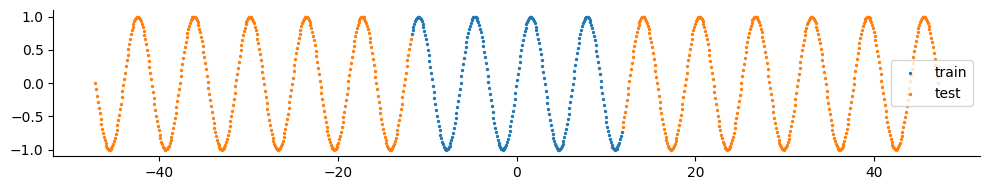

In [240]:
x_train, y_train, x_test, y_test = gen_data(L=1000, start=-15*torch.pi, end=15*torch.pi, reverse=False)

fig, axs = plt.subplots(1, 1, figsize=(10, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

In [14]:
frames = 100
epochs_per_frame = 100

In [35]:
count_nodes = 256
lr = 0.001
batch_size = len(x_train) - 1
use_embedding_loss = True
emb_loss_beta = 1

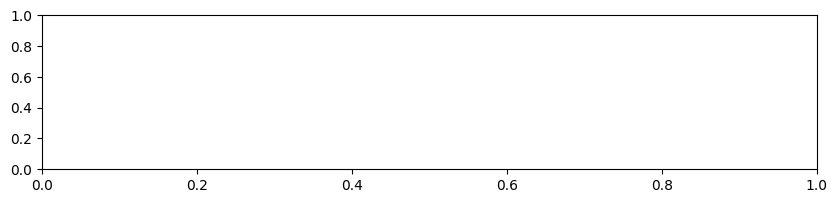

In [36]:
# for animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

In [ ]:
resnet=False

model = MLP(count_nodes, resnet)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=frames,
                               interval=1)
HTML(anim.to_jshtml(fps=15))

In [ ]:
resnet=True

model = MLP(count_nodes, resnet)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig,
                               animate,
                               frames=frames,
                               interval=1)
HTML(anim.to_jshtml(fps=15))

In [ ]:
model(x_train[:3, None])
model.x_feats[0, :3]

## Extrapolation Experiment

Now what if we make this an interpolation problem instead of an extrapolation problem. In other words, what if we reverse the train and test set? Will the model be able to infer the sine wave in between the test data? We show below the sine wave colored by train (blue) and test (orange)

In [ ]:
x_train, y_train, x_test, y_test = gen_data(reverse=True)

fig, axs = plt.subplots(1, 1, figsize=(10, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

In [ ]:
# for animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

In [ ]:
count_hidden = 2
count_nodes = 256

model = MLP(count_hidden=count_hidden, count_nodes=count_nodes, 
            use_batchnorm=use_batchnorm, use_xavier_normal=use_xavier_normal)
model = model.to(device)
optim = torch.optim.Adam(model.parameters(),lr=lr)
# scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

anim = animation.FuncAnimation(fig, 
                               animate, 
                               frames=frames, 
                               interval=1)
HTML(anim.to_jshtml(fps=30))

## Take-aways

## Acknowledgements

Thanks
* Kristian for the resnet idea
* Stan for the embedding similarity idea